Christian Hellum Bye \
chbye@berkeley.edu \
04-28-22

# Homework 9: scikit-image

Due April 28th at 8pm

## Asteroid tracking

Complete the asteroid tracking breakout from class.

What worked well, what went wrong, and what approaches could help in a real-world scenario to improve results?

In [1]:
import skimage as ski
import matplotlib.pyplot as plt
import numpy as np

import matplotlib
matplotlib.rcParams['image.interpolation'] = 'nearest'
matplotlib.rcParams['image.cmap'] = 'gray'
matplotlib.rcParams['figure.figsize'] = (10, 7)

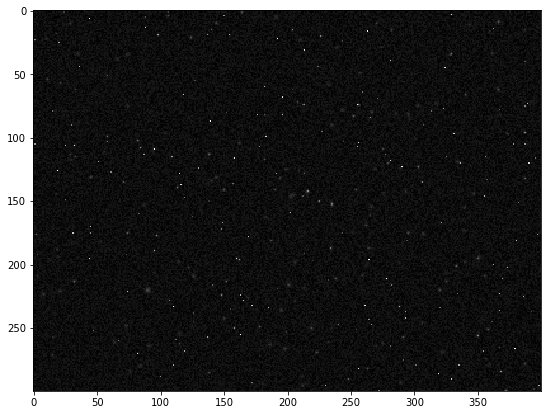

In [2]:
# asteroid images
frames = ski.io.ImageCollection('asteroid/*.png')
# show a random image
plt.imshow(frames[3])
plt.show()

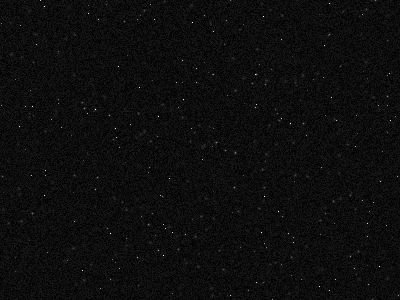

In [3]:
# gif of images
from IPython.display import Image
Image('asteroid/asteroid.gif', width=600)

There is a moving object in these frames (a single frame shown above)! Can you find it? We know that the object moves in a straight line; can you fit a line to its trajectory?

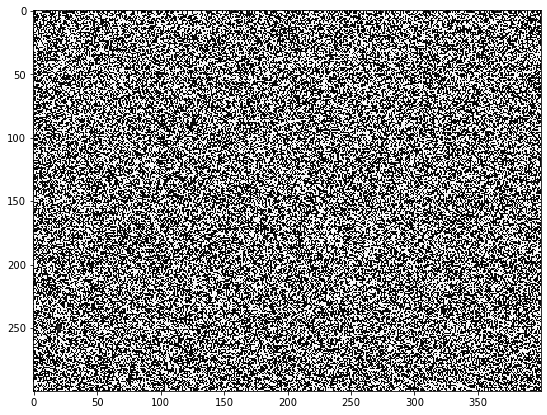

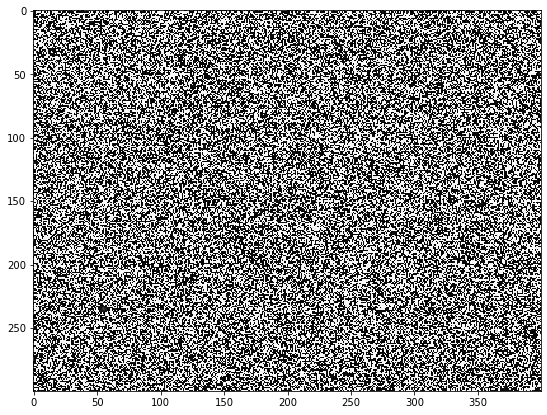

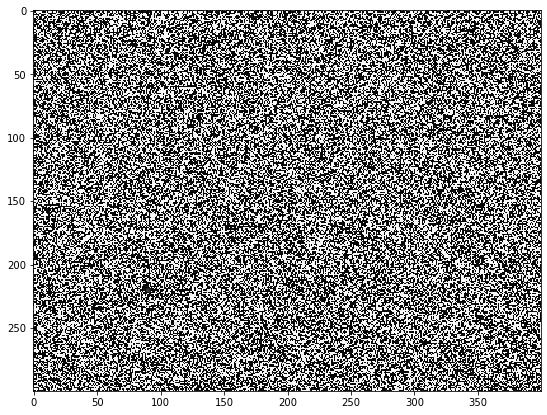

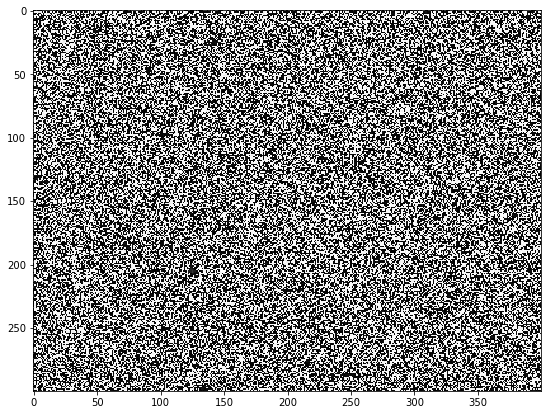

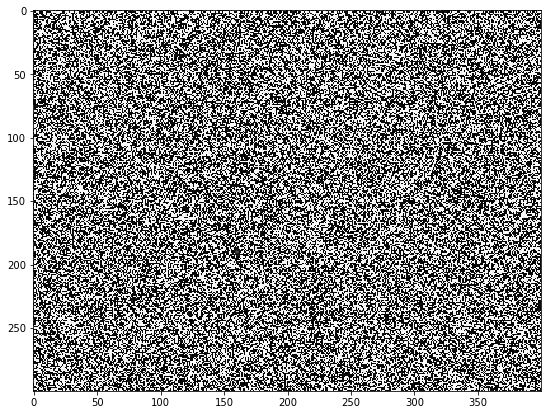

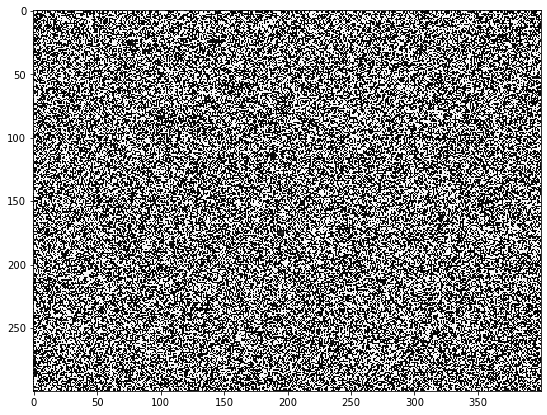

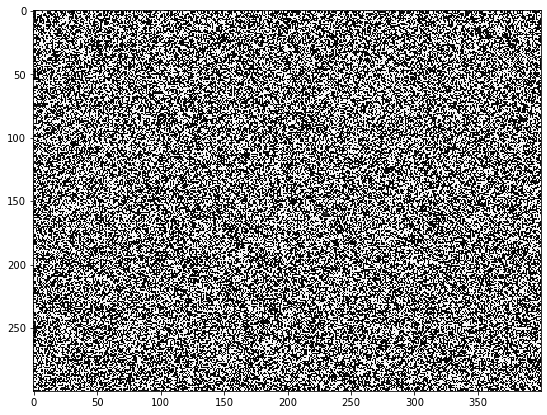

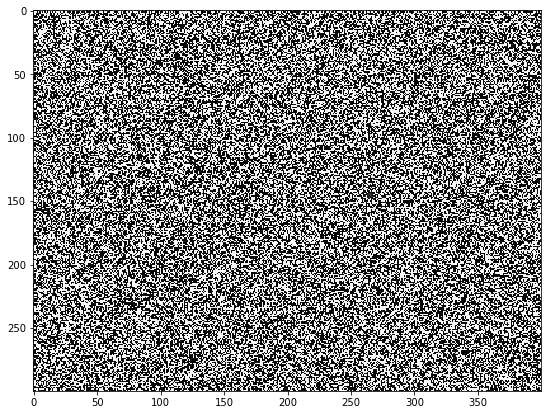

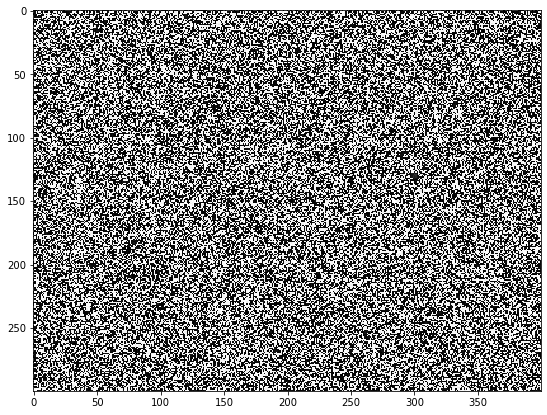

In [4]:
# image 0 is a reference image without the asteroid
# Hence, the asteroid should be in the difference of other frames and the reference frame. The rest is noise.
for i in range(1, len(frames)):
    plt.imshow(frames[i] - frames[0])
    plt.show()

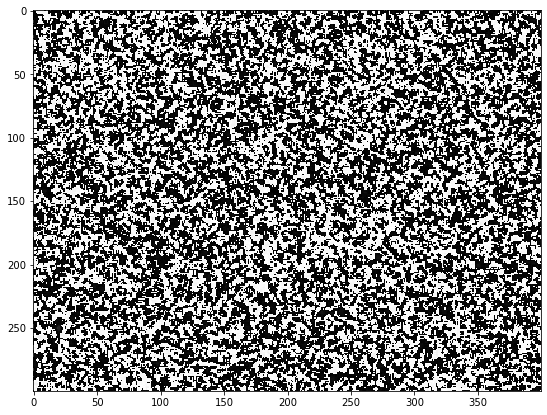

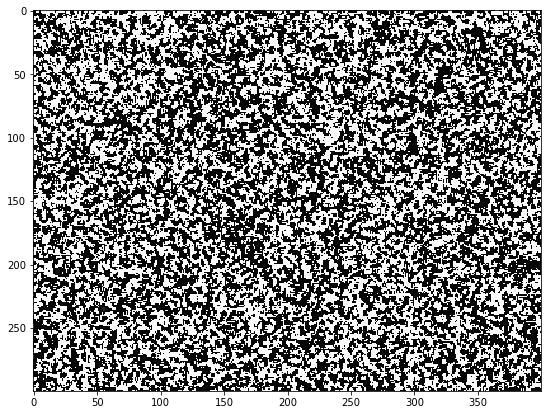

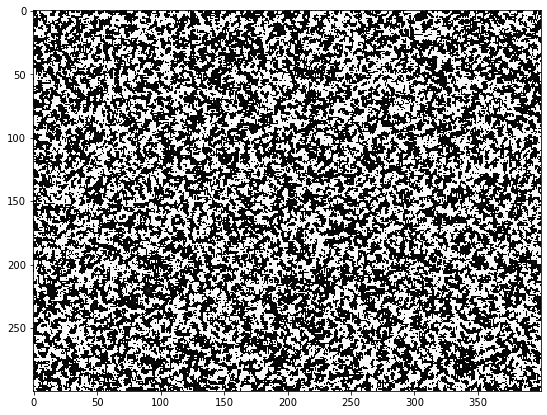

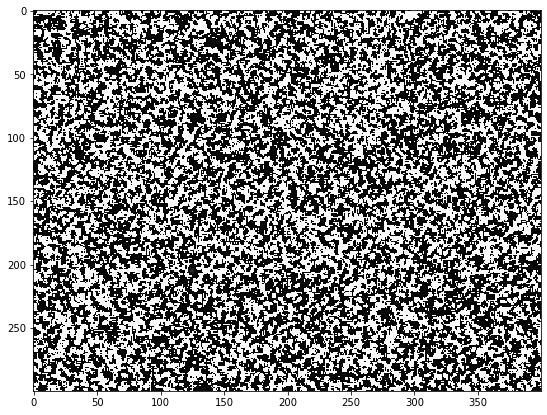

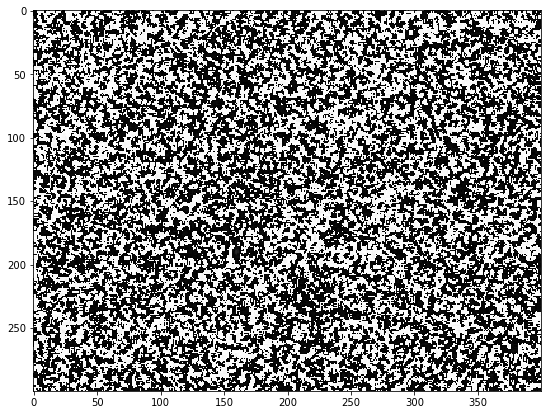

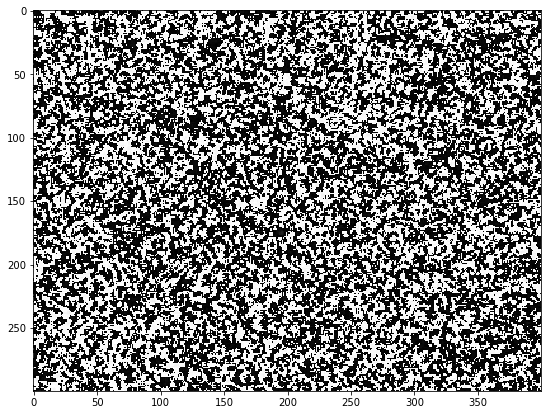

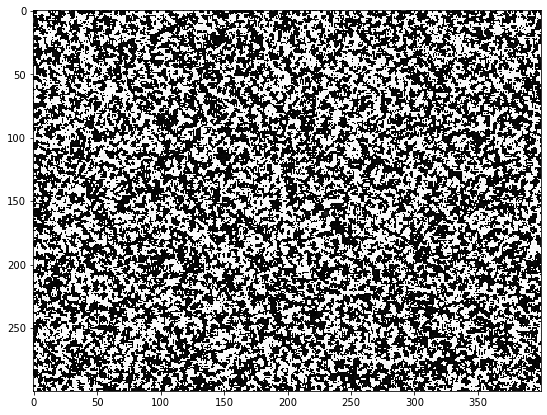

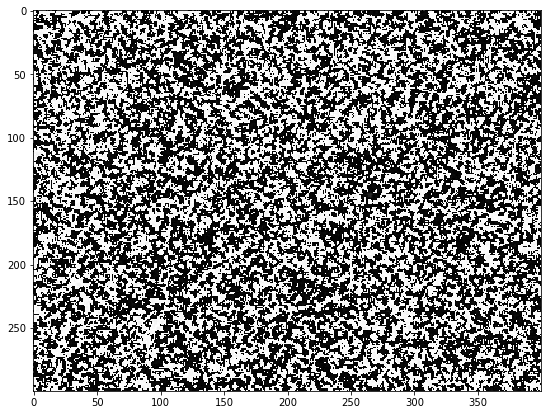

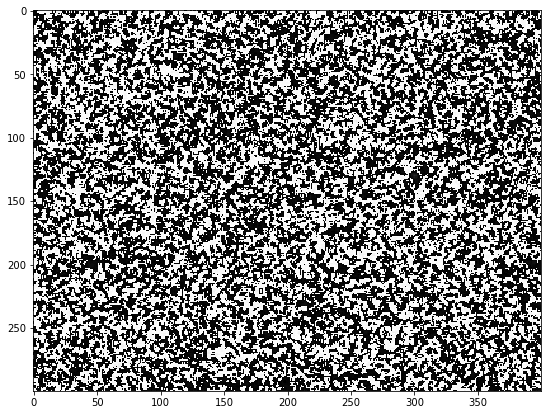

In [5]:
# try denoising with median fiter
denoised = [ski.filters.median(x) for x in frames]
for i in range(1, len(frames)):
    plt.imshow(denoised[i] - denoised[0])
    plt.show()

The images are all noisy still and we cannot see the asteroid when subtracting the reference frame. Try instead subtracting mean of the frames from the denoised image. 

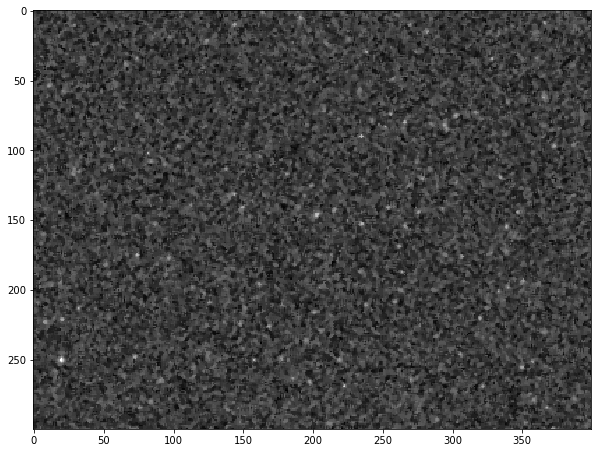

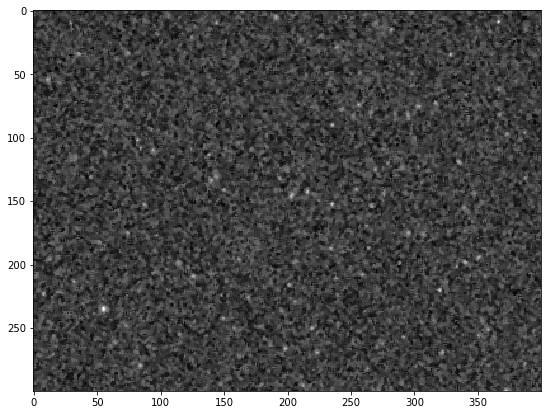

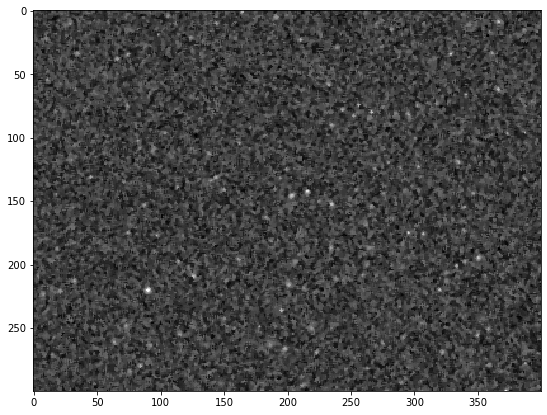

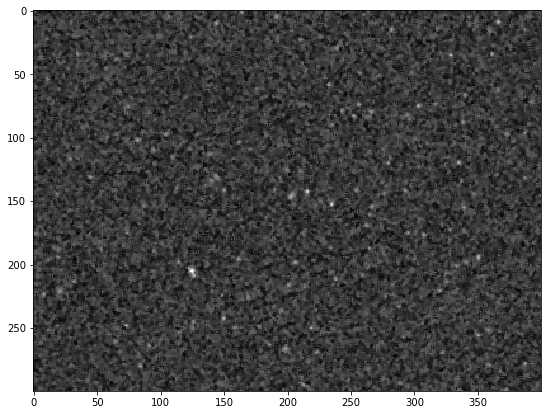

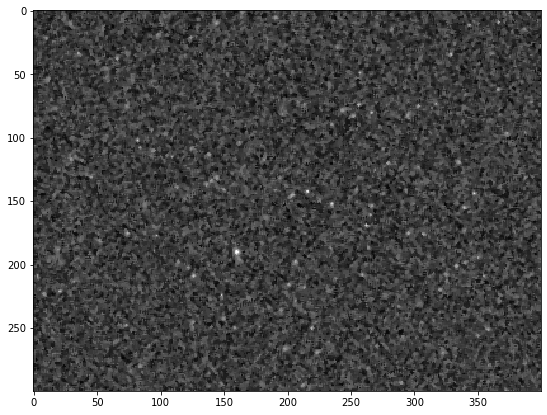

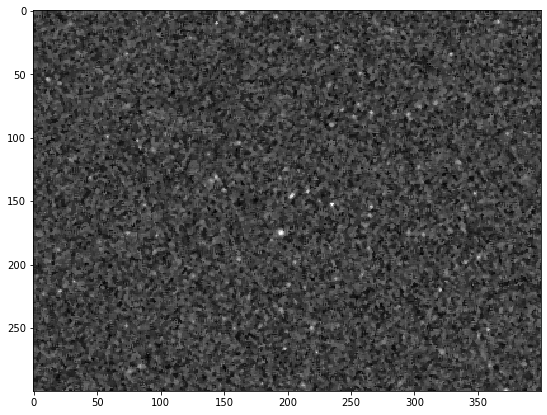

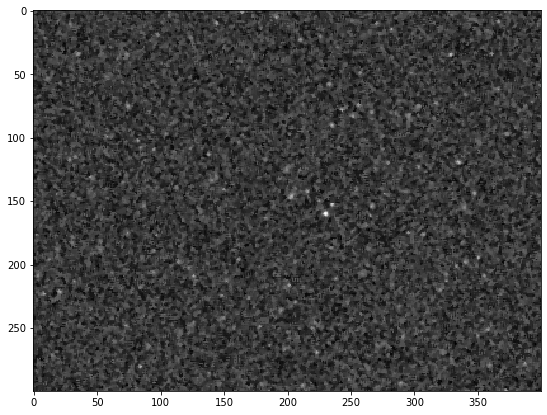

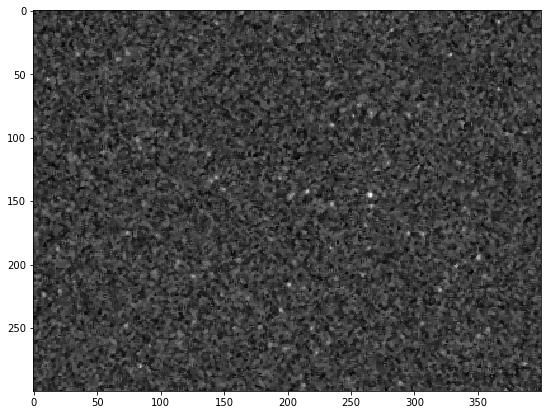

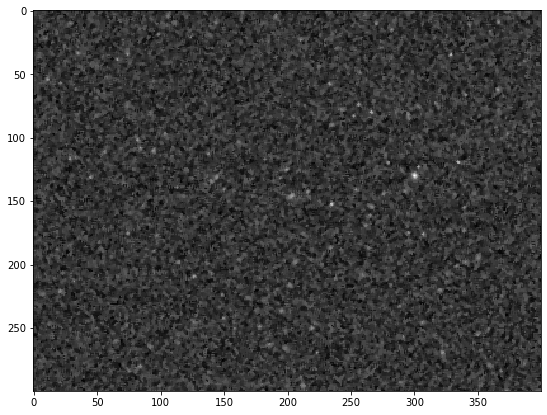

In [6]:
plt.figure(figsize=(10, 10))
for i in range(1, len(frames)):
    plt.imshow(denoised[i] - np.mean(frames))
    plt.show()

The asteroid should be where the difference between the images is the greatest. Let's look at that in the case of the third frame.

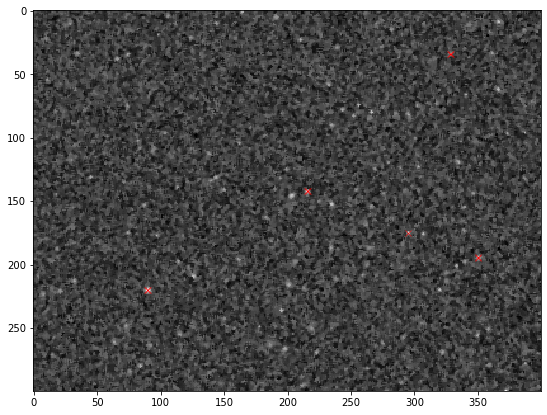

In [7]:
delta = denoised[3] - np.mean(frames)  # difference between frame 3 and mean of frames
T = 0.7  # minimum intensity of local peaks: they need to be at least 70% the brightness of the global max

peaks = ski.feature.peak_local_max(delta, threshold_rel=T)
plt.imshow(delta)
plt.scatter(peaks[:, 1], peaks[:, 0], marker='x', lw=0.5, color='red')  # highlight the local maxs in red
plt.show()

Having localized some candidate peaks in frame 3, we redo the analysis for all frames.

In [8]:
all_peaks = []
mean_frame = np.mean(frames)
for f in denoised[1:]:
    delta = f - mean_frame
    peaks = ski.feature.peak_local_max(delta, threshold_rel=T)
    all_peaks.extend(peaks.tolist())

In [9]:
all_peaks = np.array(all_peaks)
all_peaks.shape = (-1, 2)

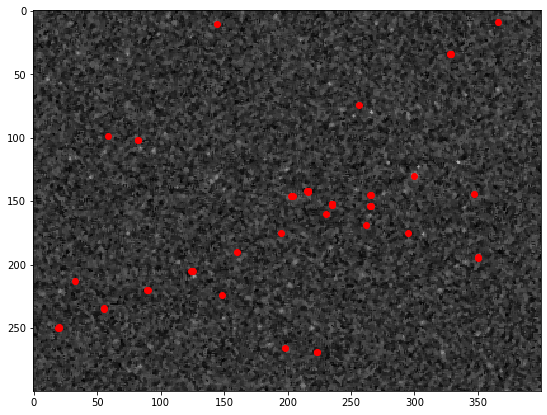

In [10]:
plt.imshow(delta)
plt.scatter(all_peaks[:, 1], all_peaks[:, 0], color='r', marker='o');

In [11]:
# use the RANSAC algorithm to fit a linear model to the peaks, while rejecting outliers
model, inliers = ski.measure.ransac(all_peaks[:, ::-1],
                                    ski.measure.LineModelND,
                                    min_samples=2,
                                    residual_threshold=1)

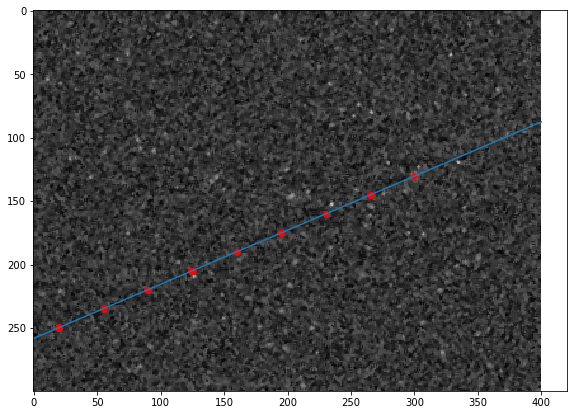

In [12]:
plt.imshow(delta)
track = all_peaks[inliers]
plt.scatter(track[:, 1], track[:, 0], color='r', marker='o')

x = np.linspace(0, delta.shape[1], 100)
plt.plot(x, model.predict_y(x))
plt.show()

The algorithm gives us an origin, $\mathcal{O}$, and direction, $\mathbf{v}$, defined such that any point $\mathbf{X}$ on the line satisfies:
$$\mathbf{X}(t) = \mathcal{O} + t\mathbf{v}$$

This can be rewritten as:
$$
\begin{cases}
    x(t) = \mathcal{O}_x + tv_x \\
    y(t) = \mathcal{O}_y + tv_y
\end{cases}
$$

Thus,

$$t = \frac{x-\mathcal{O}_x}{v_x} \\
y(x) = \mathcal{O}_y + \frac{x-\mathcal{O}_x}{v_x}v_y \\
y(x) = \frac{v_y}{v_x}x + \left(\mathcal{O}_y + \frac{v_y}{v_x}\mathcal{O}_x\right)$$

In [13]:
origin, direction = model.params

slope = direction[1]/direction[0]
intercept = origin[1] + slope*origin[0]

print(f"The line of best fit is given by y={slope:.2g}x+{intercept:.2g}.")
print(f"The velocity is given by v = {np.array2string(direction, precision=2)}")

The line of best fit is given by y=-0.43x+1.4e+02.
The velocity is given by v = [ 0.92 -0.39]


What went well? What went wrong?

The RANSAC algorithm is doing a good job at finding the inliers and is able to fit a reasoanble line. However, this is likely more difficult for real-world data. Given the number of outliers / false detections, it is remarkable that we were able to fit a line for the asteroid.

In real life, more images are likely needed to be able to determine the inliers with better confidence.

## Panorama stitching

One of the scikit-image tutorials shows [how to do panorama stitching](https://github.com/scikit-image/skimage-tutorials/blob/master/lectures/solutions/adv3_panorama-stitching-solution.ipynb).

Take 3 or 4 overlapping photos of your own, and use the procedure described to stitch your own panorama.

In [217]:
def compare(*images, labels=None):
    """
    Display images side by side.
    
    Parameters
    ----------
    image0, image1, image2, ... : ndarrray
        Images to display.
    labels : list
        Labels for the different images.
    """
    if labels is None:
        labels = [''] * len(images)
    
    fig, axs = plt.subplots(nrows=1, ncols=len(images), figsize=(15,10))
    
    for n, (image, label) in enumerate(zip(images, labels)):
        axs[n].imshow(image, interpolation='nearest', cmap='gray')
        axs[n].set_title(label)
        axs[n].axis('off')
    
    fig.tight_layout()

In [218]:
import skimage.io as io

pano_imgs = io.ImageCollection("panorama/*")[:-1]

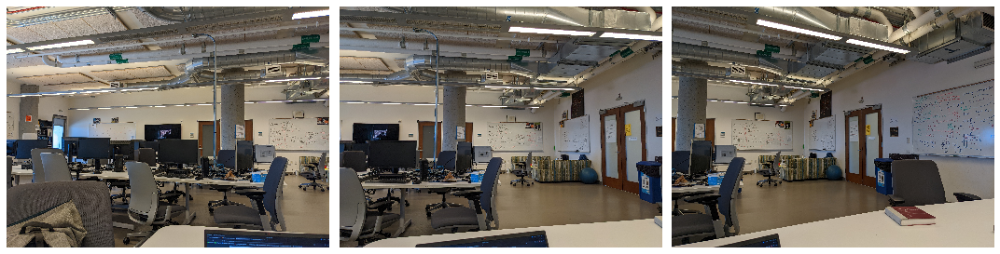

In [219]:
compare(*pano_imgs)

## Step 1: Greyscaling

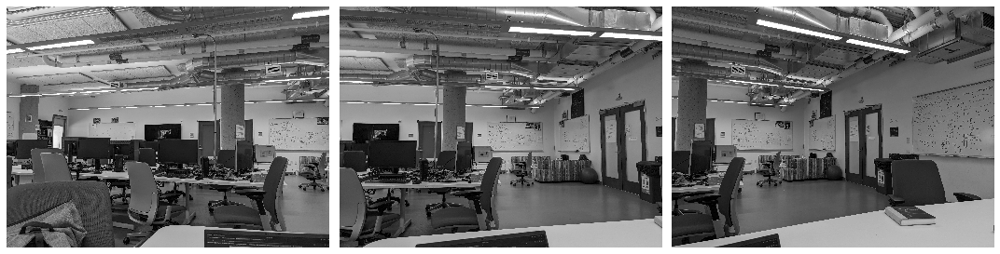

In [220]:
from skimage.color import rgb2gray
# greyscale
grey_pano = [rgb2gray(im) for im in pano_imgs]
compare(*grey_pano)

## Step 2: Feature Detection

In [221]:
from skimage.feature import ORB

# Initialize ORB
# 800 keypoints is large enough for robust results, 
# but low enough to run within a few seconds. 
orb = ORB(n_keypoints=800, fast_threshold=0.05)

# Detect keypoints in images
keypoints = []
descs = []
for pano in grey_pano:
    orb.detect_and_extract(pano)
    keypoints.append(orb.keypoints)
    descs.append(orb.descriptors)

We take the second (center) image to be the anchored destination image.

In [222]:
from skimage.feature import match_descriptors

matches = []

match = match_descriptors(descs[0], descs[1], cross_check=True)
matches.append(match)

match = match_descriptors(descs[1], descs[2], cross_check=True)
matches.append(match)

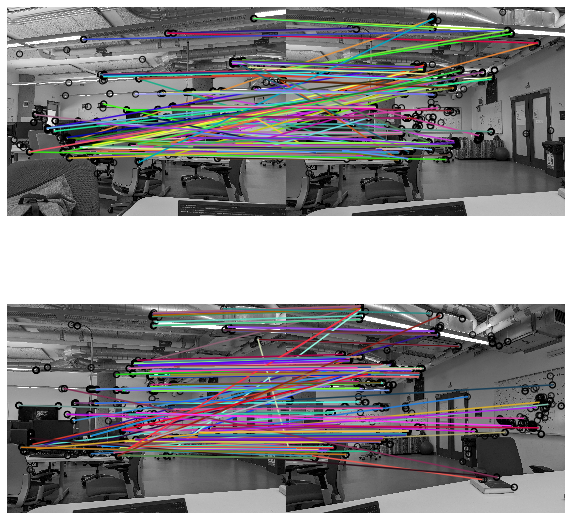

In [223]:
from skimage.feature import plot_matches
fig, axs = plt.subplots(figsize=(10,10), ncols=1, nrows=len(matches)) 
for i, match in enumerate(matches):
    plot_matches(axs[i], grey_pano[i], grey_pano[i+1], keypoints[i], keypoints[i+1], match)
    axs[i].axis('off')
plt.show()

In [224]:
# we use RANSAC again to reject outliers (false matches between adjacent pictures)
from skimage.transform import ProjectiveTransform

# Select keypoints from 
#   * source (image to be registered): pano0
#   * target (reference image): our middle frame registration target
models = []
inliers = []

# src: 0 <-> target: 1
src = keypoints[0][matches[0][:, 0]][:, ::-1]
dst = keypoints[1][matches[0][:, 1]][:, ::-1]
m, i = ski.measure.ransac((src, dst), ProjectiveTransform, min_samples=8, residual_threshold=1, max_trials=300)
models.append(m)
inliers.append(i)

# src: 2 <-> target: 1
src = keypoints[2][matches[1][:, 1]][:, ::-1]
dst = keypoints[1][matches[1][:, 0]][:, ::-1]
m, i = ski.measure.ransac((src, dst), ProjectiveTransform, min_samples=8, residual_threshold=1, max_trials=300)
models.append(m)
inliers.append(i)

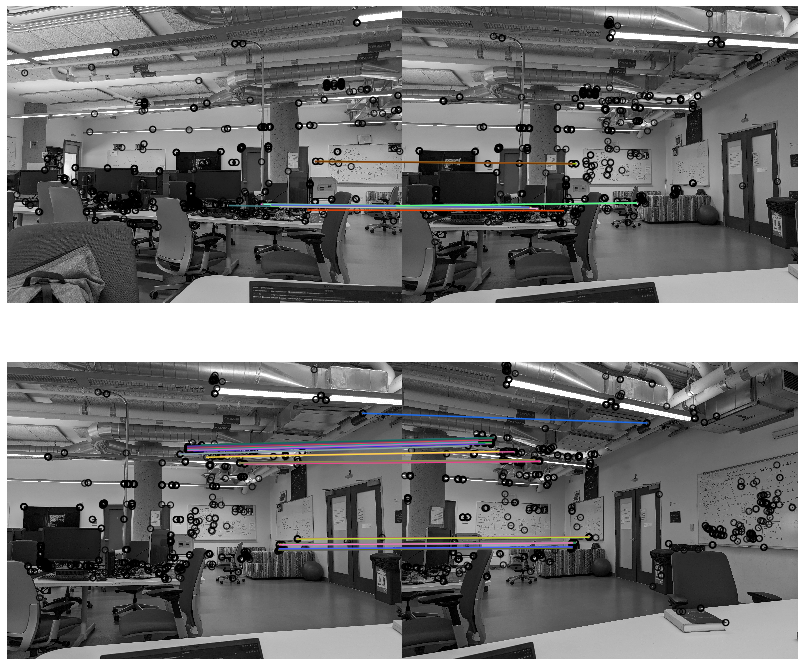

In [225]:
fig, axs = plt.subplots(nrows=len(matches), ncols=1, figsize=(15, 12))

# Best match subset
for i, match in enumerate(matches):
    ax = axs[i]
    plot_matches(ax, grey_pano[i], grey_pano[i+1], keypoints[i], keypoints[i+1], match[inliers[i]])
    ax.axis('off')

plt.show()

## Step 4: Warp images

In [229]:
from skimage.transform import SimilarityTransform

# Shape of center image, our registration target
r, c = grey_pano[1].shape

corners = np.array([[0, 0],
                    [0, r],
                    [c, 0],
                    [c, r]])

# warp image corners to their new positions
warped_corners01 = models[0](corners)
warped_corners12 = models[1](corners)

# find extents
all_corners = np.vstack((warped_corners01, warped_corners12, corners))

corner_min = np.min(all_corners, axis=0)
corner_max = np.max(all_corners, axis=0)
output_shape = (corner_max - corner_min)

output_shape = np.ceil(output_shape[::-1]).astype(int)



In [230]:
from skimage.transform import warp

warped = []
masks = []

offset = SimilarityTransform(translation= -corner_min)
transforms = [offset+models[0], offset, offset+models[1]]
for i, image in enumerate(grey_pano):
    
    pano_warped = warp(image, transforms[i].inverse, order=3, output_shape=output_shape, cval=-1)

    # Acquire the image mask for later use
    mask = (pano_warped != -1)
    pano_warped[~mask] = 0
    
    warped.append(pano_warped)
    masks.append(mask)

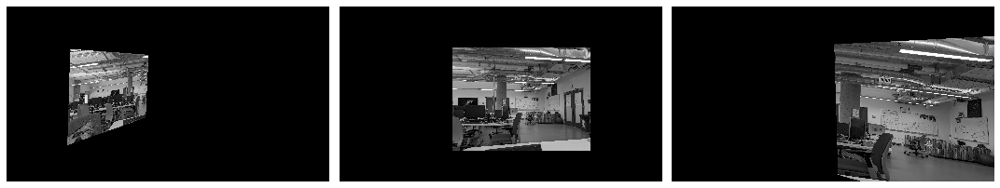

In [231]:
compare(*warped)

## Step 5: Combine images

In [232]:
merged = np.sum(warped, axis=0)
overlap = np.array(masks, dtype=float).sum(axis=0)
normalized = merged / np.maximum(overlap, 1)

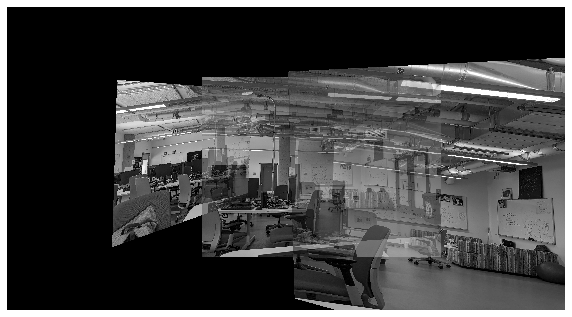

In [233]:
plt.figure()
plt.imshow(normalized, cmap='gray')
plt.gca().axis("off")
plt.show()

## Step 5, More Sophisticated

In [234]:
rmax = output_shape[0] - 1
cmax = output_shape[1] - 1

mask_pts01 = [[0,    cmax // 3],
              [rmax, cmax // 3]]

mask_pts12 = [[0,    2*cmax // 3],
              [rmax, 2*cmax // 3]]



Take the cost algorithm from the provided tutorial ...

In [235]:
from skimage.morphology import flood_fill

def generate_costs(diff_image, mask, vertical=True, gradient_cutoff=2.):
    """
    Ensures equal-cost paths from edges to region of interest.

    Parameters
    ----------
    diff_image : ndarray of floats
        Difference of two overlapping images.
    mask : ndarray of bools
        Mask representing the region of interest in ``diff_image``.
    vertical : bool
        Control operation orientation.
    gradient_cutoff : float
        Controls how far out of parallel lines can be to edges before
        correction is terminated. The default (2.) is good for most cases.

    Returns
    -------
    costs_arr : ndarray of floats
        Adjusted costs array, ready for use.
    """
    if vertical is not True:
        return tweak_costs(diff_image.T, mask.T, vertical=vertical,
                           gradient_cutoff=gradient_cutoff).T

    # Start with a high-cost array of 1's
    costs_arr = np.ones_like(diff_image)

    # Obtain extent of overlap
    row, col = mask.nonzero()
    cmin = col.min()
    cmax = col.max()
    shape = mask.shape

    # Label discrete regions
    labels = mask.copy().astype(np.uint8)
    cslice = slice(cmin, cmax + 1)
    submask = np.ascontiguousarray(labels[:, cslice])
    submask = flood_fill(submask, (0, 0), 2)
    submask = flood_fill(submask, (shape[0]-1, 0), 3)
    labels[:, cslice] = submask

    # Find distance from edge to region
    upper = (labels == 2).sum(axis=0).astype(np.float64)
    lower = (labels == 3).sum(axis=0).astype(np.float64)

    # Reject areas of high change
    ugood = np.abs(np.gradient(upper[cslice])) < gradient_cutoff
    lgood = np.abs(np.gradient(lower[cslice])) < gradient_cutoff

    # Give areas slightly farther from edge a cost break
    costs_upper = np.ones_like(upper)
    costs_lower = np.ones_like(lower)
    costs_upper[cslice][ugood] = upper[cslice].min() / np.maximum(upper[cslice][ugood], 1)
    costs_lower[cslice][lgood] = lower[cslice].min() / np.maximum(lower[cslice][lgood], 1)

    # Expand from 1d back to 2d
    vdist = mask.shape[0]
    costs_upper = costs_upper[np.newaxis, :].repeat(vdist, axis=0)
    costs_lower = costs_lower[np.newaxis, :].repeat(vdist, axis=0)

    # Place these in output array
    costs_arr[:, cslice] = costs_upper[:, cslice] * (labels[:, cslice] == 2)
    costs_arr[:, cslice] +=  costs_lower[:, cslice] * (labels[:, cslice] == 3)

    # Finally, place the difference image
    costs_arr[mask] = diff_image[mask]

    return costs_arr

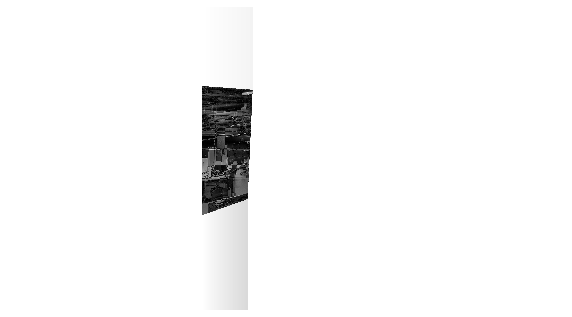

In [236]:
costs01 = generate_costs(np.abs(warped[0] - warped[1]), masks[0] & masks[1])

costs01[0,  :] = 0
costs01[-1, :] = 0

plt.figure()
plt.imshow(costs01, cmap='gray', interpolation='none')
plt.gca().axis('off')
plt.show()

In [238]:
from skimage.graph import route_through_array

pts,_ = route_through_array(costs01, mask_pts01[0], mask_pts01[1], fully_connected=True)
pts = np.array(pts)

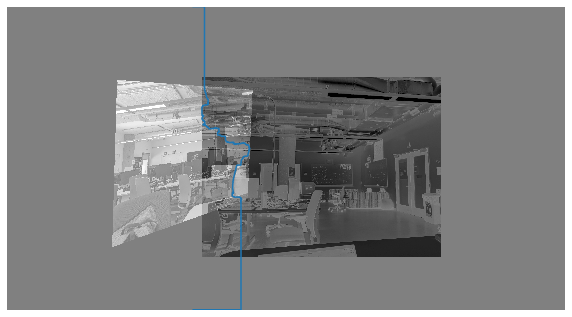

In [239]:
plt.figure()
plt.imshow(warped[0] - warped[1], cmap='gray')
plt.plot(pts[:, 1], pts[:, 0])  
plt.gca().axis('off')
plt.show()

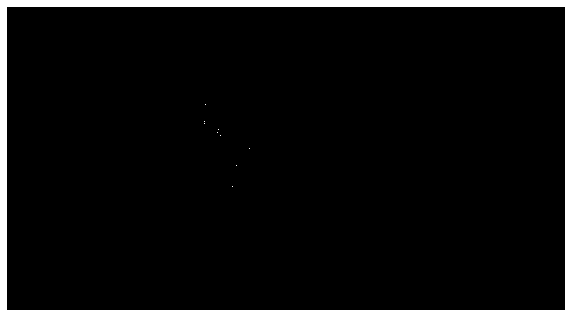

In [240]:
mask0 = np.zeros_like(warped[0], dtype=np.uint8)
mask0[pts[:, 0], pts[:, 1]] = 1

plt.figure()
plt.imshow(mask0, cmap="gray")
plt.gca().axis("off")
plt.show()

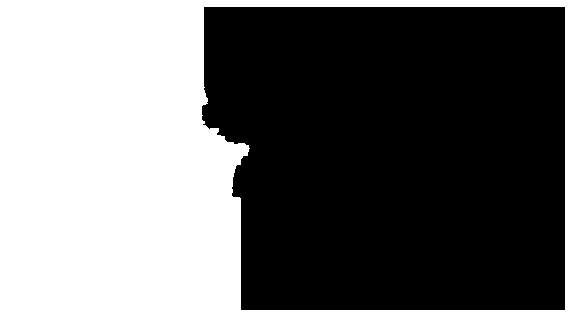

In [241]:
from skimage.morphology import flood_fill

mask0 = flood_fill(mask0, (0, 0), 1, connectivity=1)

plt.figure()
plt.imshow(mask0, cmap='gray')
plt.gca().axis("off")
plt.show()

## Redo for rightmost image

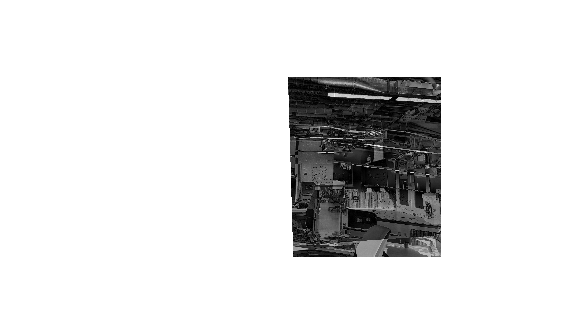

In [242]:
costs12 = generate_costs(np.abs(warped[1] - warped[2]),
                         masks[1] & masks[2])
costs12[0,  :] = 0
costs12[-1, :] = 0

costs12[mask0 > 0] = 1

plt.figure()
plt.imshow(costs12, cmap='gray')
plt.gca().axis("off")
plt.show()

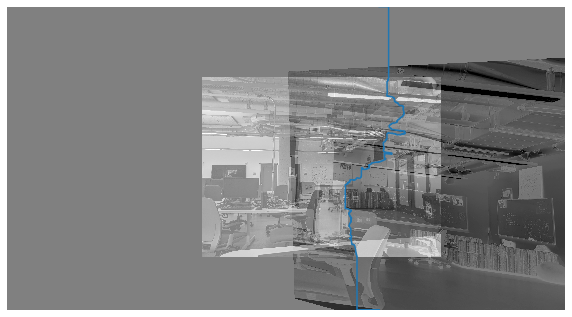

In [243]:
pts, _ = route_through_array(costs12, mask_pts12[0], mask_pts12[1], fully_connected=True)
pts = np.array(pts)

plt.figure()
plt.imshow(warped[1] - warped[2], cmap='gray')
plt.plot(pts[:, 1], pts[:, 0])
plt.gca().axis("off")
plt.show()

In [244]:
mask2 = np.zeros_like(warped[0], dtype=np.uint8)
mask2[pts[:, 0], pts[:, 1]] = 1

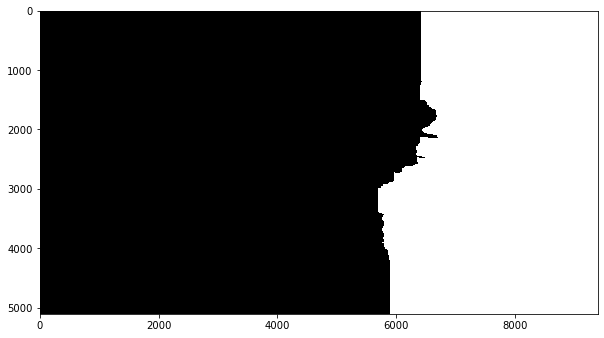

In [245]:
mask2 = flood_fill(mask2, (rmax, cmax), 1, connectivity=1)

# The result
plt.imshow(mask2, cmap='gray');

In [246]:
mask1 = ~(mask0.astype(np.bool) | mask2.astype(np.bool))

/tmp/ipykernel_13738/945517663.py:1: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask1 = ~(mask0.astype(np.bool) | mask2.astype(np.bool))


In [247]:
def add_alpha(img, mask=None):
    """
    Adds a masked alpha channel to an image.
    
    Parameters
    ----------
    img : (M, N[, 3]) ndarray
        Image data, should be rank-2 or rank-3 with RGB channels
    mask : (M, N[, 3]) ndarray, optional
        Mask to be applied. If None, the alpha channel is added
        with full opacity assumed (1) at all locations.
    """
    from skimage.color import gray2rgb
    if mask is None:
        mask = np.ones_like(img)
        
    if img.ndim == 2:
        img = gray2rgb(img)
    
    return np.dstack((img, mask))

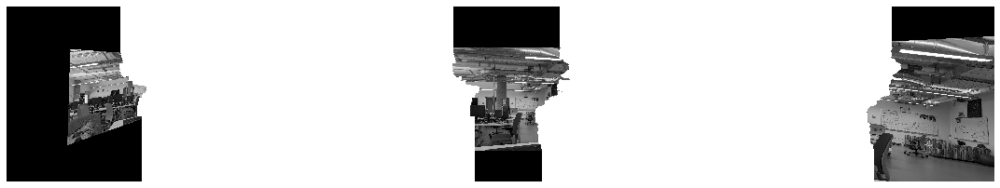

In [248]:


pano0_final = add_alpha(warped[0], mask0)
pano1_final = add_alpha(warped[1], mask1)
pano2_final = add_alpha(warped[2], mask2)

compare(pano0_final, pano1_final, pano2_final)



In [ ]:
fig, ax = plt.subplots(figsize=(12, 12))

# This is a perfect combination, but matplotlib's interpolation
# makes it appear to have gaps. So we turn it off.
ax.imshow(pano0_final, interpolation='none')
ax.imshow(pano1_final, interpolation='none')
ax.imshow(pano2_final, interpolation='none')

fig.tight_layout()
ax.axis('off');

## Image Stacking

Stack several photos of the night sky to reveal its structure. Here are some datasets you can use:

- https://chandra.harvard.edu/photo/openFITS/
- https://esahubble.org/projects/fits_liberator/m17data/
- https://www.photographingspace.com/homework-download-stack-data/
- https://www.astropix.com/html/processing/practice_files.html
- https://www.astrobin.com/forum/c/astrophotography/other/all-my-raw-files-are-or-will-be-public-online/

(While you should use Python code to do the stacking, you can also compare your results to those obtained using dedicated software such as https://siril.org/.)

We use the images of Cas A. We set the lowest energy band to red, the middle band to green, and the largest to blue.

In [160]:
fnames = [file for file in Path("casa").iterdir()]

In [163]:
fnames.sort()

In [164]:
fnames

[PosixPath('casa/casa_0.5-1.5keV.fits'),
 PosixPath('casa/casa_1.5-3.0keV.fits'),
 PosixPath('casa/casa_4.0-6.0keV.fits')]

In [161]:
np.sortfnames

[PosixPath('casa/casa_1.5-3.0keV.fits'),
 PosixPath('casa/casa_4.0-6.0keV.fits'),
 PosixPath('casa/casa_0.5-1.5keV.fits')]

In [213]:
from astropy.io import fits
import skimage as skimg
from pathlib import Path

ims = []
files = [file for file in Path("casa").iterdir()]
files.sort()  # arange in order of increasing energy
for file in files:
    f = fits.open(file)
    im = f[0].data
    f.close()
    ims.append(im)
    
ims = np.array(ims).T
ims /= ims.max(axis=(0,1))  # normalize

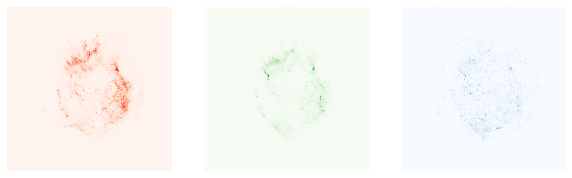

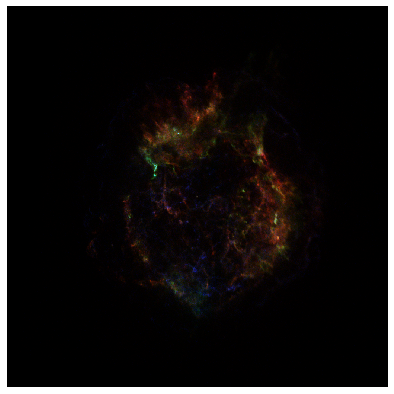

In [214]:
colors = ["Reds", "Greens", "Blues"]
fig, axs = plt.subplots(ncols=3)
for i in range(ims.shape[-1]):
    ax = axs[i]
    ax.imshow(ims[:, :, i], cmap=colors[i])
    ax.axis("off")
plt.show()

plt.figure()
plt.imshow(ims)
plt.gca().axis("off")
plt.show()

In [215]:
ims = skimg.exposure.adjust_gamma(ims, gamma=0.6, gain=1) 
ims = skimg.exposure.rescale_intensity(ims, in_range=(0.0,0.7), out_range=(0.0,1.0))

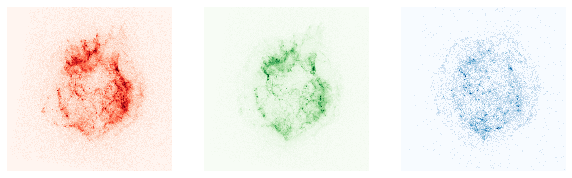

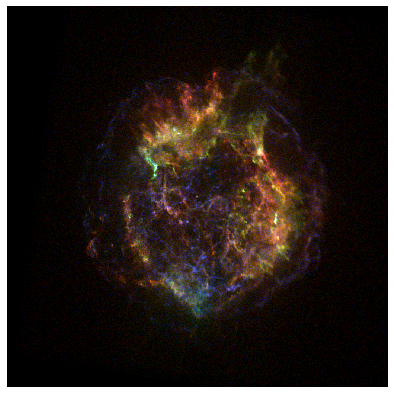

In [216]:
fig, axs = plt.subplots(ncols=3)
for i in range(ims.shape[-1]):
    ax = axs[i]
    ax.imshow(ims[:, :, i], cmap=colors[i])
    ax.axis("off")
plt.show()

plt.figure()
plt.imshow(ims)
plt.gca().axis("off")
plt.show()